In [150]:

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



In [151]:
df = pd.read_csv("Crop_details.csv")
np.random.seed(42)
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")
np.random.seed(42)
df.head()

,Unnamed: 0,path,crop,croplabel
0,0,/kaggle/input/kag2/sugarcane/sugarcane037ahs.jpeg,sugarcane,3
1,1,/kaggle/input/kag2/sugarcane/sugarcane034a.jpeg,sugarcane,3
2,2,/kaggle/input/kag2/sugarcane/sugarcane032arot....,sugarcane,3
3,3,/kaggle/input/kag2/sugarcane/sugarcane036ahs.jpeg,sugarcane,3
4,4,/kaggle/input/kag2/sugarcane/sugarcane023ahs.jpeg,sugarcane,3


In [152]:
# df.isna().sum()

In [153]:


import random
random.seed(0)
np.random.seed(0)

In [154]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras
from keras.layers import Conv2D
from keras.models import Sequential
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.models import Model
from keras.src.legacy.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix

from sklearn.metrics import accuracy_score
import cv2
import re
import random
random.seed(0)
np.random.seed(0)

Text(0.5, 1.0, 'wheat')

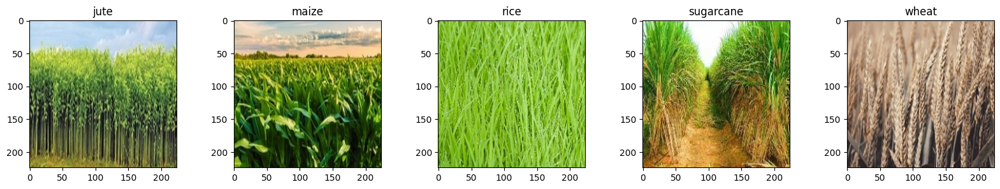

In [155]:
wheat = plt.imread("./content/wheat/wheat009a.jpeg")
jute = plt.imread("./content/jute/jute008a.jpeg")
cane = plt.imread("./content/sugarcane/sugarcane012a.jpeg")
rice = plt.imread("./content/rice/rice006a.jpeg")
maize = plt.imread("./content/maize/maize009a.jpeg")
plt.figure(figsize=(20,3))
plt.subplot(1,5,1)
plt.imshow(jute)
plt.title("jute")
plt.subplot(1,5,2)
plt.imshow(maize)
plt.title("maize")
plt.subplot(1,5,3)
plt.imshow(rice)
plt.title("rice")
plt.subplot(1,5,4)
plt.imshow(cane)
plt.title("sugarcane")
plt.subplot(1,5,5)
plt.imshow(wheat)
plt.title("wheat")

In [156]:
jutepath = "./content/jute"
maizepath = "./content/maize"
ricepath = "./content/rice"
sugarcanepath = "./content/sugarcane"
wheatpath = "./content/wheat"

jutefilename = os.listdir(jutepath)
maizefilename = os.listdir(maizepath)
ricefilename = os.listdir(ricepath)
sugarcanefilename = os.listdir(sugarcanepath)
wheatfilename = os.listdir(wheatpath)

X= []
for fname in jutefilename:
    X.append([os.path.join(jutepath,fname),0])
for fname in maizefilename:
    X.append([os.path.join(maizepath,fname),1])
for fname in ricefilename:
    X.append([os.path.join(ricepath,fname),2])
for fname in sugarcanefilename:
    X.append([os.path.join(sugarcanepath,fname),3])
for fname in wheatfilename:
    X.append([os.path.join(wheatpath,fname),4])
X = pd.DataFrame(X,columns = ['path','labels'])
X.head()

,path,labels
0,./content/jute\jute001a.jpeg,0
1,./content/jute\jute002a.jpeg,0
2,./content/jute\jute003a.jpeg,0
3,./content/jute\jute004a.jpeg,0
4,./content/jute\jute005a.jpeg,0


In [157]:
ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'int64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)
train,test = train_test_split(label_X,test_size=0.2,random_state=0,shuffle = True)
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values
def flat_x(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img.reshape([1,-1]))
    flat =  np.array(flat)
    flat = flat.reshape(-1,224*224*3)
    return flat
def flat_x_oned(data):
    data = flat_x(data)
    data  = data[:,:224*224]
    return flat
flat_X_train = flat_x(X_train)
flat_X_test = flat_x(X_test)

In [158]:
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)
    flat = flat.reshape(-1,224,224,3)
    return flat

In [159]:
dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

**PCA**

In [160]:
##PCA decomposition
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_train_pca=pca.fit_transform(flat_X_train)
print(flat_X_train.shape)
print(X_train_pca.shape)

(160, 150528)
(160, 2)


**TNSE**

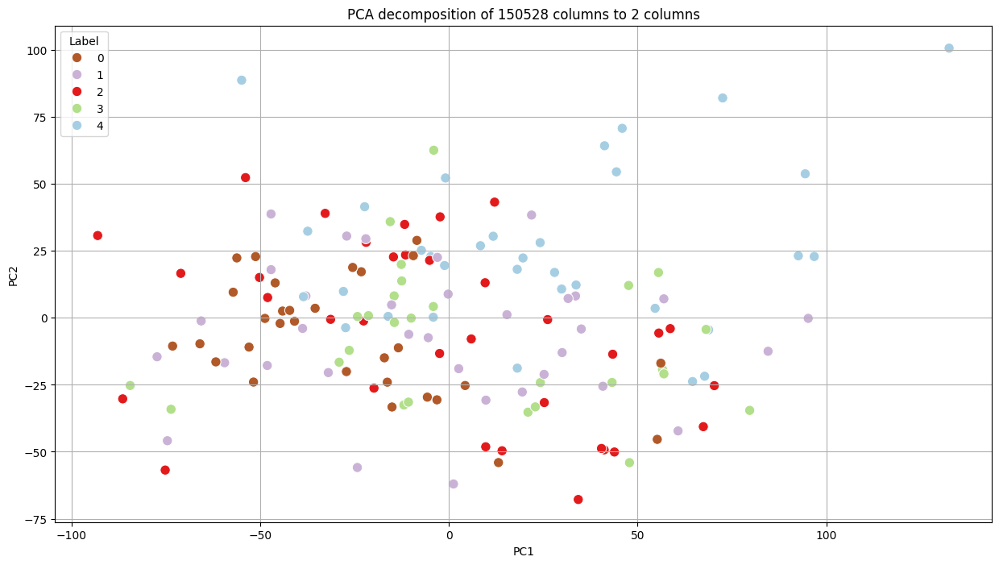

In [161]:
import seaborn as sns
plt.figure(figsize=(15,8))
# sns.scatterplot(X_train_pca[:,0],X_train_pca[:,1],hue = np.ravel(y_train),palette='Paired_r',s=80)
data = {'PC1': X_train_pca[:, 0], 'PC2': X_train_pca[:, 1], 'Label': np.ravel(y_train)}
df = pd.DataFrame(data)
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Label', palette='Paired_r', s=80)
plt.title("PCA decomposition of 150528 columns to 2 columns")
plt.grid()

In [162]:
from sklearn.manifold import TSNE
tsne=TSNE(n_components=2,random_state=0)
X_train_tsne=tsne.fit_transform(flat_X_train[:,:224*224])
print(flat_X_train.shape)
print(X_train_pca.shape)

(160, 150528)
(160, 2)


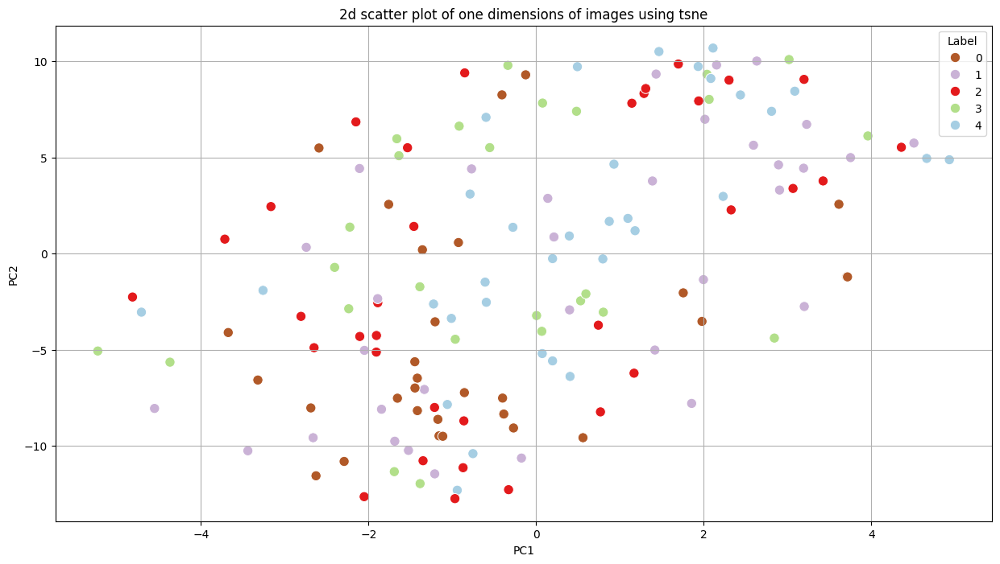

In [163]:
plt.figure(figsize=(15,8))
# sns.scatterplot(X_train_tsne[:,0],X_train_tsne[:,1],hue = np.ravel(y_train),palette='Paired_r',s=80)
data = {'PC1': X_train_tsne[:, 0], 'PC2': X_train_tsne[:, 1], 'Label': np.ravel(y_train)}
df = pd.DataFrame(data)
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Label', palette='Paired_r', s=80)
plt.title("2d scatter plot of one dimensions of images using tsne")
plt.grid()

In [164]:
##Model training
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
lr.fit(flat_X_train,np.ravel(y_train))

LogisticRegression()

In [165]:
##Test Score
lr.score(flat_X_test,np.ravel(y_test))

0.34146341463414637

In [166]:
ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'float64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)

In [167]:
train,test = train_test_split(new_X,test_size=0.2,random_state=32,shuffle = True)
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)
    flat = flat.reshape(-1,224,224,3)
    return flat

dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

In [168]:
keras.backend.clear_session()
vgg = keras.applications.VGG19(input_shape=(224,224,3),include_top=False,weights = 'imagenet',pooling='avg')
vgg.trainable = False
vggmodel = keras.Sequential([vgg
                         ,Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(5,activation='softmax')])

vggmodel.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics=['accuracy'])
vggmodel.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)              │ ?                      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

**PIPELINING**

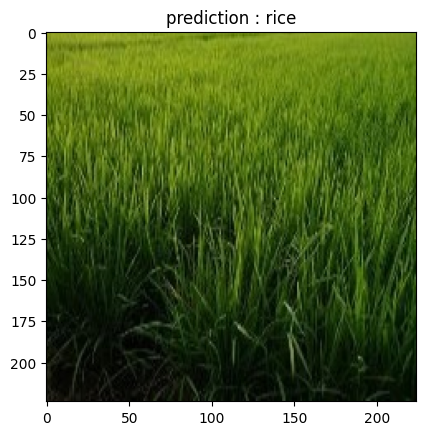

In [169]:
##Pipelining
def modelpipeline(imagepath,model = lr,label=-1):
    pdict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    pred_x = flat_x([imagepath])
    pred = model.predict(pred_x)
    plt.imshow(plt.imread(imagepath))
    if (label!=-1):
        plt.title("prediction : {} \naccurate  : {}".format(pdict[pred[0]],pdict[label]))
    else:
        plt.title("prediction : {}".format(pdict[pred[0]]))
###Prediction on sample images
modelpipeline('./content/rice/rice031a.jpeg')

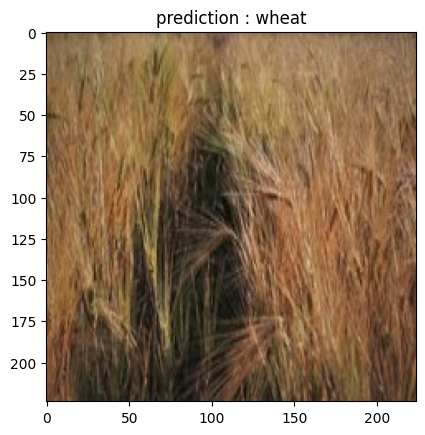

In [170]:
modelpipeline('./content/wheat/wheat011.jpeg')

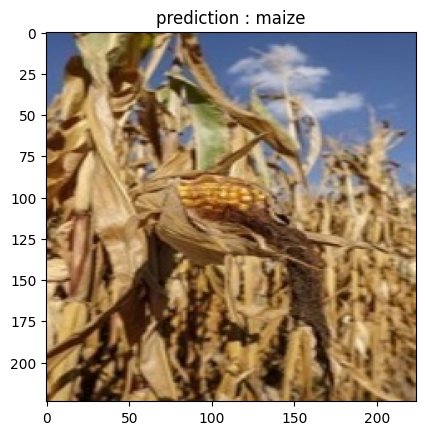

In [171]:
modelpipeline("./content/maize/maize019a.jpeg")

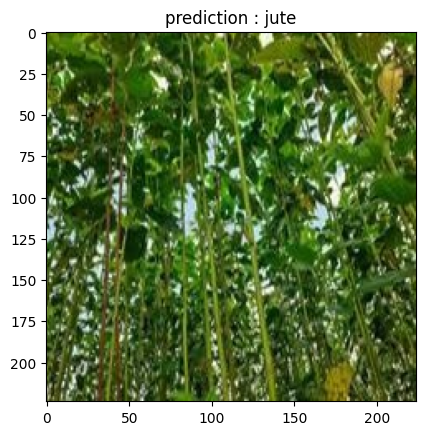

In [172]:
modelpipeline("./content/jute/jute009a.jpeg")

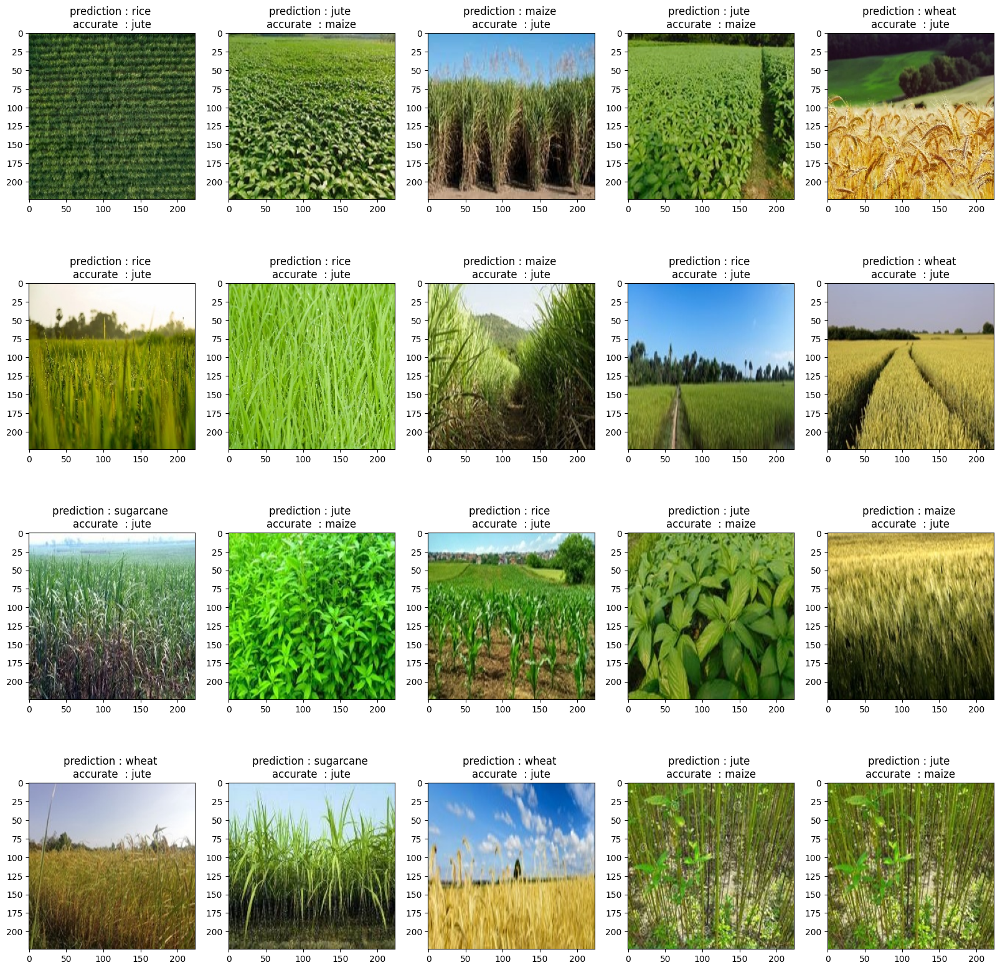

In [173]:
##Prediction on test images
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[0:20]):
    plt.subplot(4,5,num+1)
    modelpipeline(path,lr,y_test[num][0])

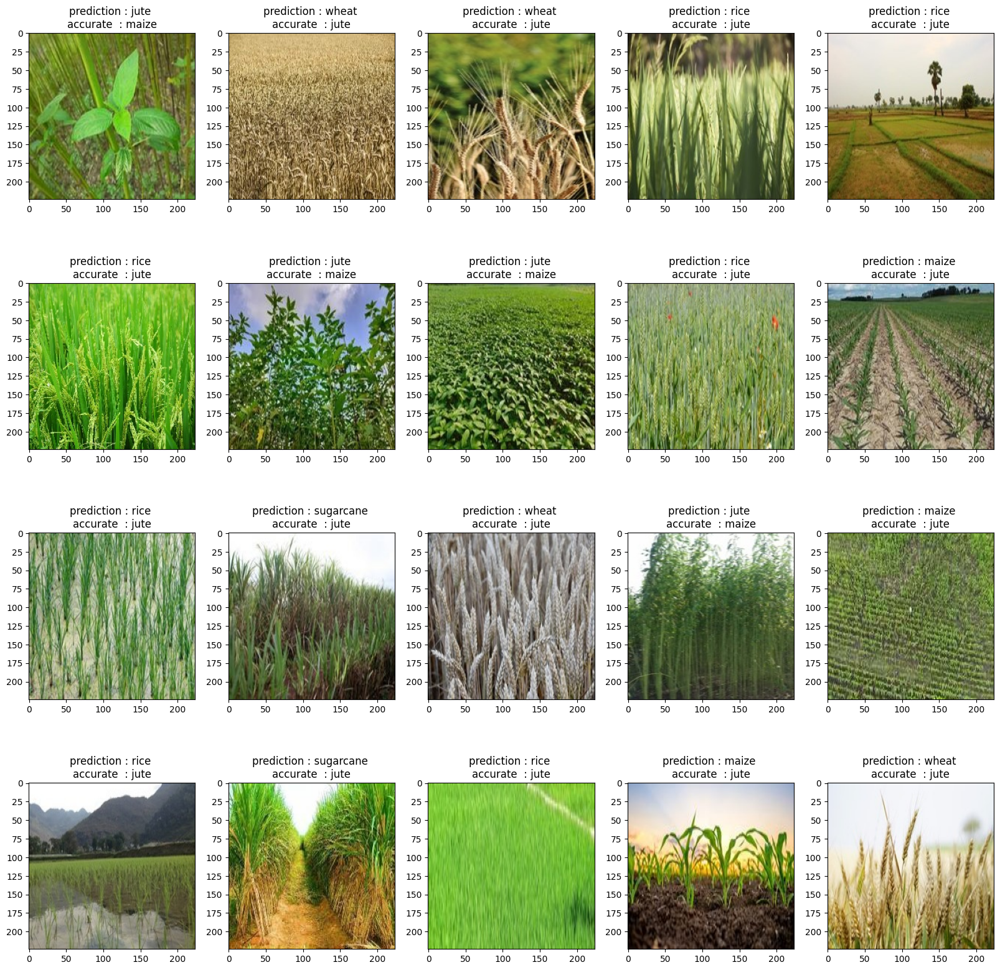

In [174]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[20:40]):
    plt.subplot(4,5,num+1)
    modelpipeline(path,lr,y_test[num+20][0])

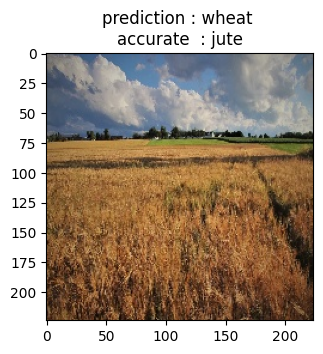

In [175]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[40:60]):
    plt.subplot(4,5,num+1)
    modelpipeline(path,lr,y_test[num+40][0])

In [176]:
###Saving Model
import joblib
filename = 'lr_model.sav'
joblib.dump(lr, filename)

['lr_model.sav']